# Homework 1

In this assignment, we will be exploring the car dataset and analyzing their fuel efficiency. <br >
Specifically, we will do some exploratory analysis with visualizations, then we will build a model for Simple Linear Regression, a model for Polynomial Regression, and one model for Logistic Regression. <br >
**The given dataset is already modified and cleaned**, but you can find [the original information here.](https://archive.ics.uci.edu/ml/datasets/auto+mpg).

## Dataset Attribute Information

1. **mpg**: Miles per gallon. This is one primary measurement for car fuel efficiency.
2. **displacement** : The cylinder volumes in cubic inches.
3. **horsepower** : Engine power.
4. **weight** : In pounds.
5. **acceleration** : The elapsed time in seconds to go from 0 to 60mph.
6. **origin** : Region of origin.

### Libraries that can be used: numpy, pandas, scikit-learn, seaborn, plotly, matplotlib
Any libraries used in the discussion materials are also allowed.

#### Other Notes
 - Don't worry about not being able to achieve high accuracy, it is neither the goal nor the grading standard of **this** assignment. <br >
 - If not specified, you are not required to do hyperparameter tuning, but feel free to do so if you'd like.
 - Discussion materials should be helpful for doing the assignments.

# Exercises
## Exercise 1 - Exploratory Analysis (20 points in total)

### Exercise 1.1 - Correlation Matrix (10 points)
Generate a Pearson [correlation matrix plot](https://heartbeat.fritz.ai/seaborn-heatmaps-13-ways-to-customize-correlation-matrix-visualizations-f1c49c816f07) in the form of a heatmap. See the link to have an idea about what this visualization should look like. <br >
After generating the plot, answer the following question: <br >
**If we are going to predict ``mpg`` in Simple Linear Regression(i.e., $y=ax+b$), which attribute are you most UNLIKELY to pick as the independent variable? Explain why.**

Requirements & notes
 - When computing correlation, make sure to drop the column ``origin`` to avoid errors.
 - The computed correlation values should be shown on the plot.
 - Use a diverging color scale with the color range being \[-1, 1\] and center being 0 (if applicable).

### Exercise 1.2 - Pairplot (10 points)
Generate a pairplot(a.k.a. scatter plot matrix) of the given dataset. <br >
After generating the plot, answer the following question: <br >
**If we are using ``horsepower`` to predict ``mpg``, which method could lead to the best performance? (Linear Regression, Polynomial Regression, or Logistic Regression) Explain why.**

Note that there is no requirement on the diagonals. You can leave empty or use other representations based on your preference. However, having ``origin``-based grouped data distributions on the diagonals effectively helps you answer some questions in the later exercises.   

Requirements
 - The points should be colored based on the column ``origin``.

## Exercise 2 - Linear and Polynomial Regression (40 points in total)

### Exercise 2.1 - Splitting Dataset (5 points)
Split the data into training and testing set with the ratio of 80:20.

### Exercise 2.2 - Simple Linear Regression (10 points)
Using one of the other attributes(excluding ``origin``) by your choice, please build a simple linear regression model that predicts ``mpg``. <br >

Requirements
 - Report the testing MSE error.

### Exercise 2.3 - Polynomial Regression (25 points)
Build polynomial regression models that predict ``mpg`` with the same choice in 2.2. <br >
Specifically, from degree=2 to degree=4, build one respectively. <br >
Then, based on the reported errors from only these three degrees, **do you think there is a sign of overfitting? Provide your reasoning.**


Requirements
 - Report the training MSE error for each of the three degrees.
 - Report the testing MSE error for each of the three degrees.


## Exercise 3 - Logistic Regression (40 points in total)

Now we are going to build a classification model on ``origin`` using all the other 5 attributes. <br >
Note that Logistic Regression is a binary classificaiton algorithm.

### Exercise 3.1 - Processing and Splitting the Dataset (10 points)
In this exercise 3, we only consider those observations where they originate from either "USA" or "Japan". <br >
So please **remove** those observations that originate from "Europe". <br >
And then, split the data into training and testing set with the ratio of 80:20. <br >


### Exercise 3.2 - Logistic Regression (30 points)

Using all the other 5 attributes, please build a Logistic Regression model that distinguishes between cars from Japan and cars from the USA. <br >
Then, **if we are distinguishing between Japan and Europe this time, how do you think the model performance(in terms of accuracy) will change? Provide your reasoning.** (Hint: Exercise 1)

Requirements
 - Report the testing precision and recall for both regions.

hello
hello


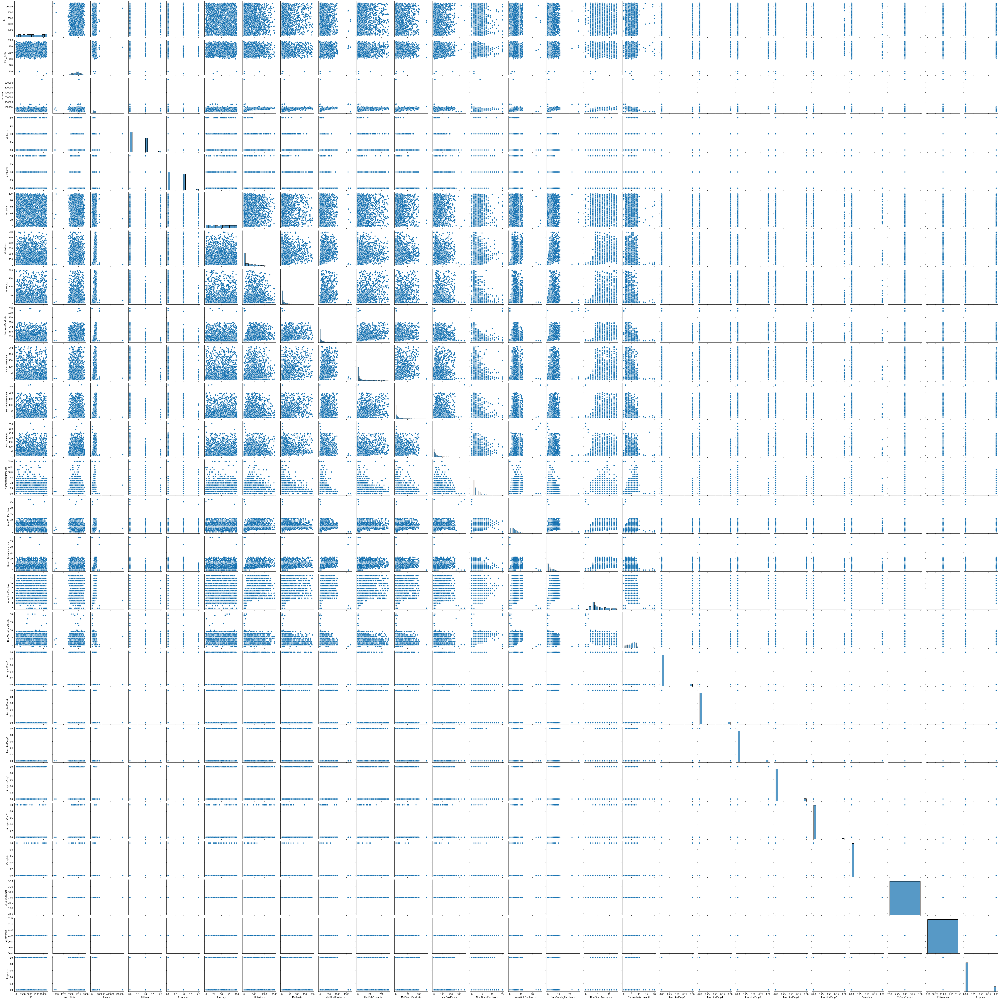

In [3]:
# one hot encode Education, Martial_Status, and 

import seaborn as sns
import matplotlib as plt
import numpy as np
import pandas as pd

df = pd.read_csv("marketing_campaign_exported.csv")

print('hello')
#_ = sns.pairplot(df, hue='class')
_ = sns.pairplot(df)
print('hello')

In [2]:
import seaborn as sns
import matplotlib as plt
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder 
from sklearn.preprocessing import OneHotEncoder

df = pd.read_csv("marketing_campaign_exported.csv")

# Do Binary Encoding for the Education and Martial Status classes

labels = df["Education"]
#print(labels)
myData_encoder = LabelEncoder()
labels_encoded =  myData_encoder.fit_transform(labels)


# binary encode
onehot_encoder = OneHotEncoder(sparse=False) # disable sparse return type
# reshape the array
labels_encoded = labels_encoded.reshape(len(labels_encoded), 1) 
onehot_encoded = onehot_encoder.fit_transform(labels_encoded)

df["Education"] = pd.Series(onehot_encoded.tolist())

labels = df["Marital_Status"]
#print(labels)
myData_encoder = LabelEncoder()
labels_encoded =  myData_encoder.fit_transform(labels)

# binary encode
onehot_encoder = OneHotEncoder(sparse=False) # disable sparse return type
# reshape the array
labels_encoded = labels_encoded.reshape(len(labels_encoded), 1) 
onehot_encoded = onehot_encoder.fit_transform(labels_encoded)

df["Marital_Status"] = pd.Series(onehot_encoded.tolist())

# Income column contains NA, drop them
df.dropna(subset = ["Income"],inplace=True)


# Drop the day and months, and keep the years
# Then one hot encode the years

df[["Day","Month","Year"]] = df["Dt_Customer"].str.split("-",expand=True)
df = df.drop(columns=["Dt_Customer","Day"])

print(df[0:15])

df.to_csv("Cleaned_dataset_Group1.csv")

      ID  Year_Birth                  Education  \
0   5524        1957  [0.0, 0.0, 1.0, 0.0, 0.0]   
1   2174        1954  [0.0, 0.0, 1.0, 0.0, 0.0]   
2   4141        1965  [0.0, 0.0, 1.0, 0.0, 0.0]   
3   6182        1984  [0.0, 0.0, 1.0, 0.0, 0.0]   
4   5324        1981  [0.0, 0.0, 0.0, 0.0, 1.0]   
5   7446        1967  [0.0, 0.0, 0.0, 1.0, 0.0]   
6    965        1971  [0.0, 0.0, 1.0, 0.0, 0.0]   
7   6177        1985  [0.0, 0.0, 0.0, 0.0, 1.0]   
8   4855        1974  [0.0, 0.0, 0.0, 0.0, 1.0]   
9   5899        1950  [0.0, 0.0, 0.0, 0.0, 1.0]   
11   387        1976  [0.0, 1.0, 0.0, 0.0, 0.0]   
12  2125        1959  [0.0, 0.0, 1.0, 0.0, 0.0]   
13  8180        1952  [0.0, 0.0, 0.0, 1.0, 0.0]   
14  2569        1987  [0.0, 0.0, 1.0, 0.0, 0.0]   
15  2114        1946  [0.0, 0.0, 0.0, 0.0, 1.0]   

                              Marital_Status   Income  Kidhome  Teenhome  \
0   [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]  58138.0        0         0   
1   [0.0, 0.0, 0.0, 0.0, 1.0, 0

In [6]:
df = pd.read_csv("marketing_campaign_exported.csv")
#sns.pairplot(df, hue="Education")

df.isna().any()

ID                     False
Year_Birth             False
Education              False
Marital_Status         False
Income                  True
Kidhome                False
Teenhome               False
Dt_Customer            False
Recency                False
MntWines               False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Z_CostContact          False
Z_Revenue              False
Response               False
dtype: bool

In [ ]:
df = pd.read_csv("marketing_campaign_exported.csv")
df.dropna(subset = ["Income"],inplace=True)
df = df.drop(columns=["Education","Martial_Status","Dt_Customer"])
print(df)
#sns.pairplot(df, hue="Education")
sns.pairplot(df)

/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Datas

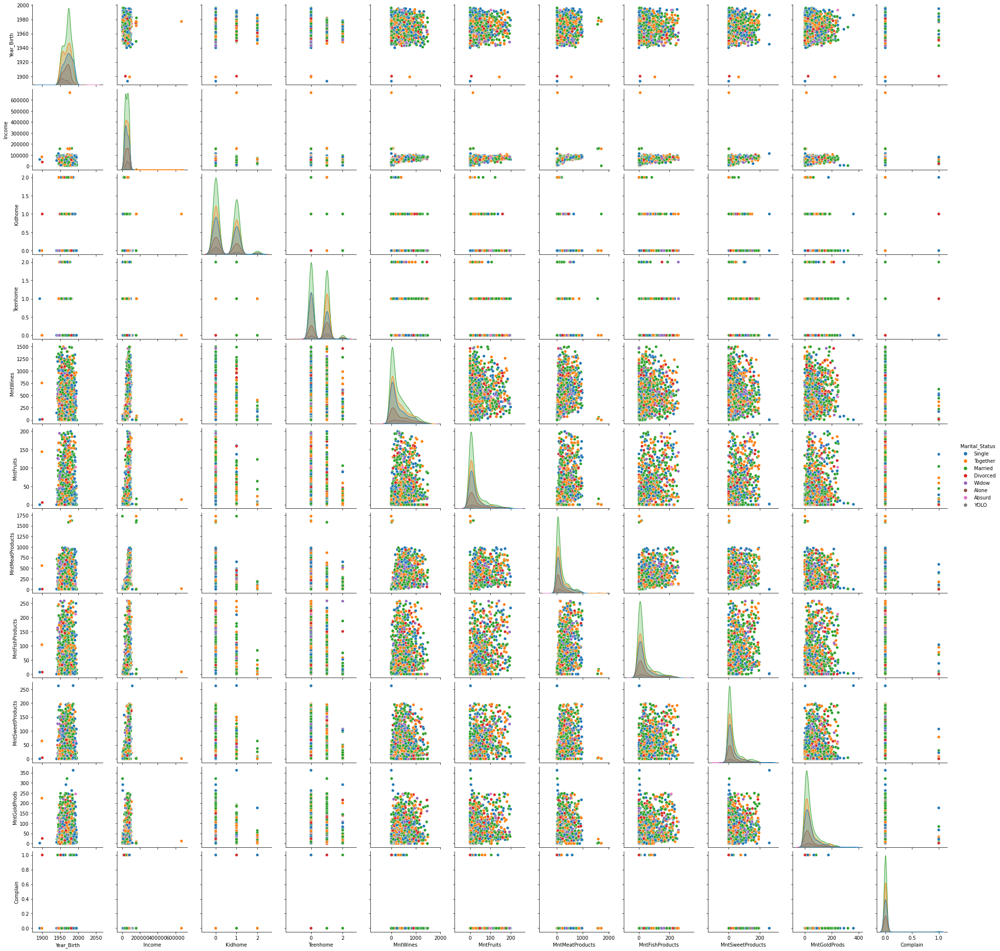

In [16]:
df = pd.read_csv("marketing_campaign_exported.csv")
df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue"])

sns.pairplot(df, hue="Marital_Status")
# Remove "Alone" "Absurd" and "YOLO"

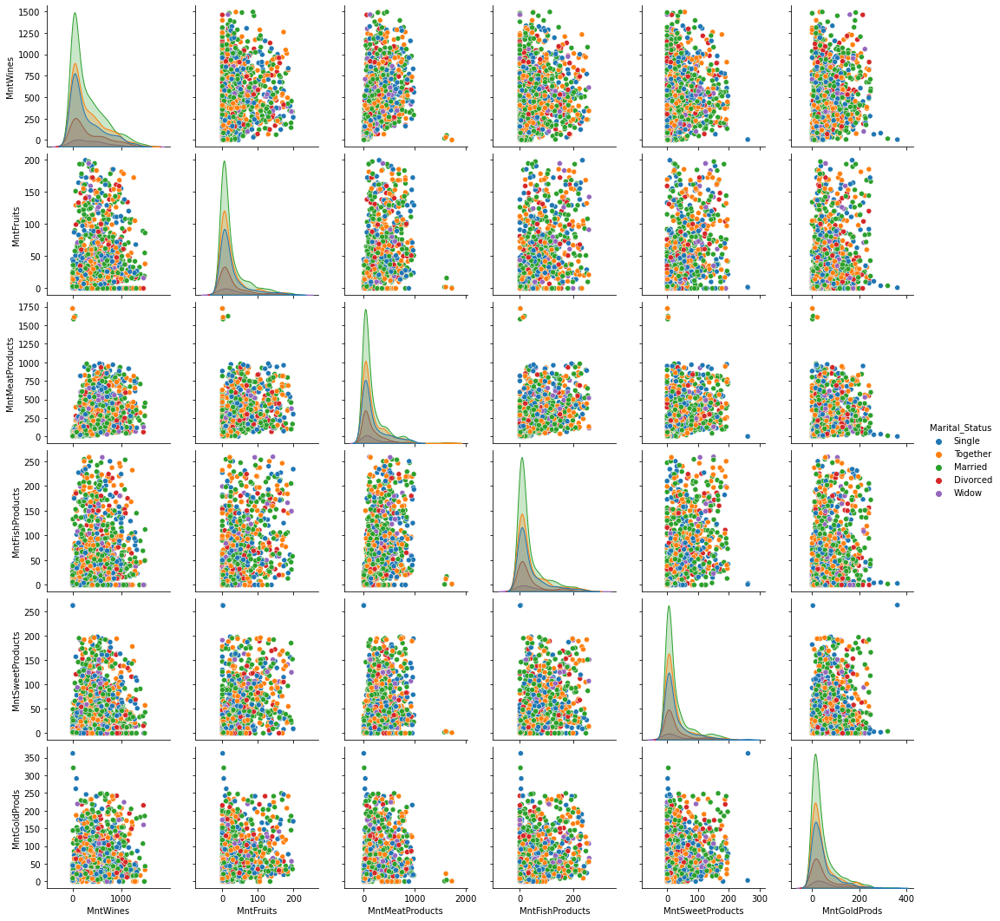

In [27]:
df = pd.read_csv("marketing_campaign_exported.csv")
df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Year_Birth","Income","Kidhome","Teenhome"])

df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]
#print(set(df.Marital_Status))
sns.pairplot(df, hue="Marital_Status")

# All with very similar overlap for Type of Food

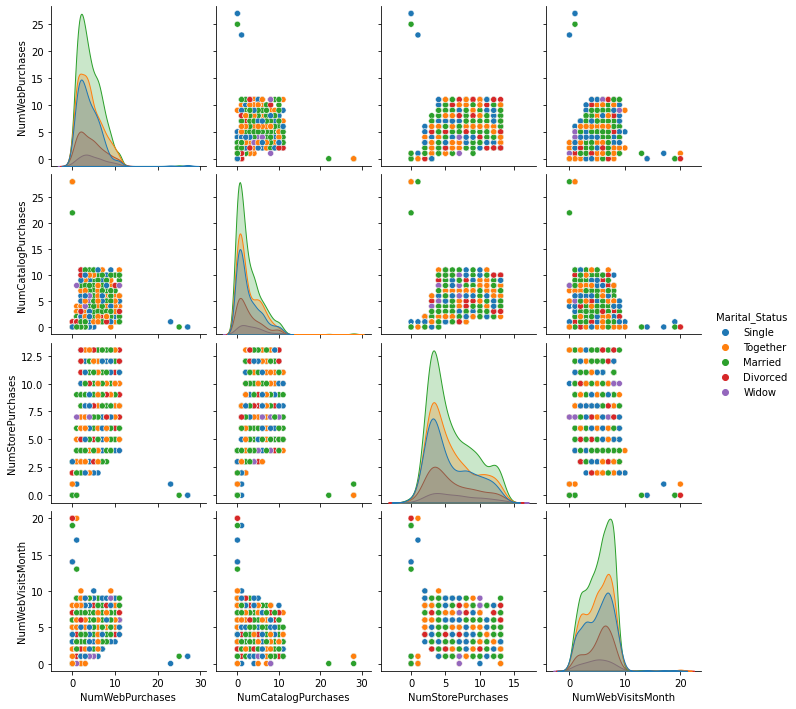

In [28]:
df = pd.read_csv("marketing_campaign_exported.csv")
#df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Year_Birth","Income","Kidhome","Teenhome"]) # Drop other independent vars


df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]
#print(set(df.Marital_Status))
sns.pairplot(df, hue="Marital_Status")

# No significant difference between Marital Status and Methods of purchase

# Married tends to have the highest number of purchases, simply bc each more married people?

# How would we know whether married people prefer certain methods or purchasing, or because
# its simply because there are more married people?

{1940, 1941, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1893, 1899, 1900}


/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/stephen/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Datas

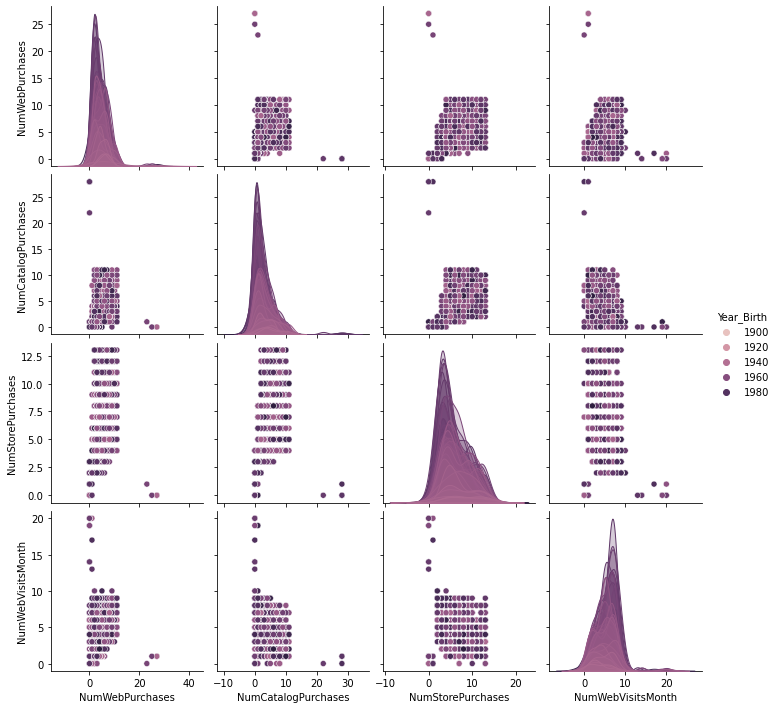

In [30]:
df = pd.read_csv("marketing_campaign_exported.csv")
#df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Kidhome","Teenhome"]) # Drop other independent vars


#df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]
print(set(df.Year_Birth))
sns.pairplot(df, hue="Year_Birth")

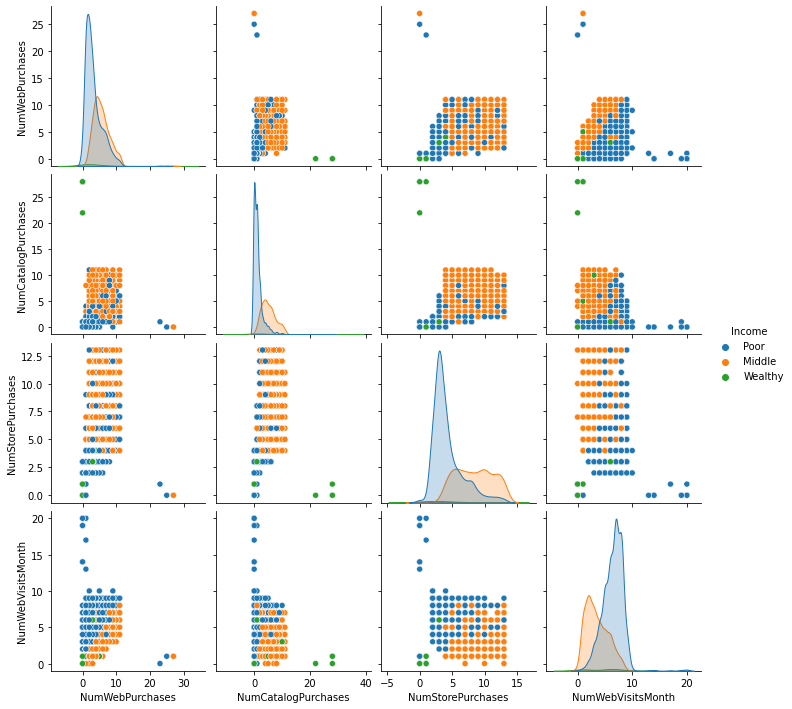

In [35]:
df = pd.read_csv("marketing_campaign_exported.csv")
#df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Year_Birth","Kidhome","Teenhome"]) # Drop other independent vars


"""
df[df.Income < 60000] = "Poor"
df[(df.Income > 60000) & (df.Income < 90000)] = "MiddleClass"
df[(df.Income > 90000) & (df.Income < 120000)] = "UpperMiddleClass"
df[df.Income > 120000] = "Wealthy"
"""

# Maybe 0 - Poor, 3 - Rich?

# https://towardsdatascience.com/the-most-efficient-if-elif-else-in-pandas-d4a7d4502d50
df["Income"] = df.apply(lambda x: "Poor" if x["Income"] < 60000
               else ("Middle" if x["Income"] > 60000 and x["Income"] < 120000 else "Wealthy"), axis=1)


#df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]
#print(set(df.Year_Birth))
sns.pairplot(df, hue="Income")


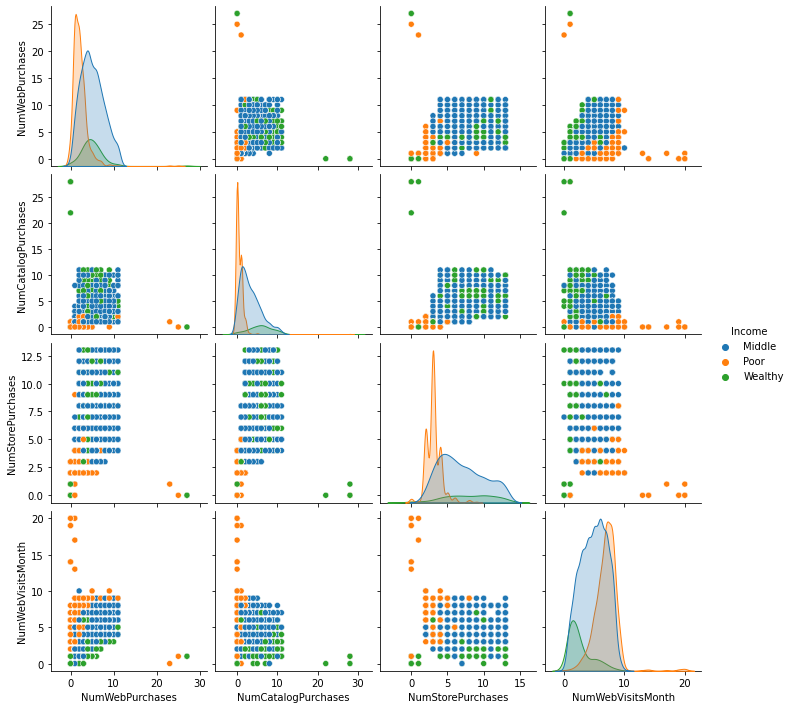

In [37]:
df = pd.read_csv("marketing_campaign_exported.csv")
#df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Year_Birth","Kidhome","Teenhome"]) # Drop other independent vars


"""
df[df.Income < 60000] = "Poor"
df[(df.Income > 60000) & (df.Income < 90000)] = "MiddleClass"
df[(df.Income > 90000) & (df.Income < 120000)] = "UpperMiddleClass"
df[df.Income > 120000] = "Wealthy"
"""

# Maybe 0 - Poor, 3 - Rich?

# https://towardsdatascience.com/the-most-efficient-if-elif-else-in-pandas-d4a7d4502d50
df["Income"] = df.apply(lambda x: "Poor" if x["Income"] < 40000
               else ("Middle" if x["Income"] > 40000 and x["Income"] < 80000 else "Wealthy"), axis=1)


#df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]
#print(set(df.Year_Birth))
sns.pairplot(df, hue="Income")

# Lots of instore purchases for 

{'Millenial', 'Boomer', 'Gen X'}


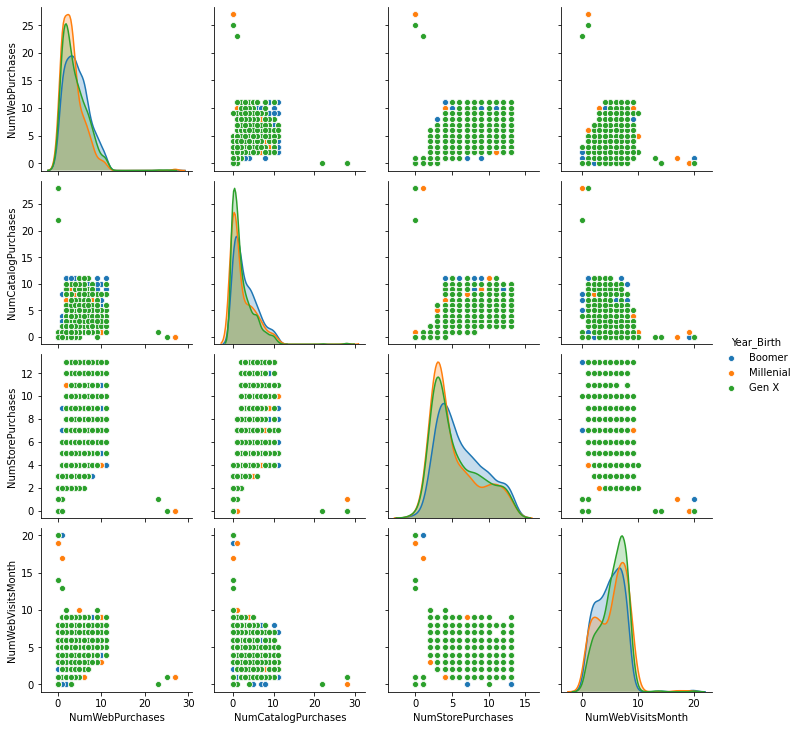

In [4]:
df = pd.read_csv("marketing_campaign_exported.csv")
#df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Kidhome","Teenhome"]) # Drop other independent vars


#df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]

df["Year_Birth"] = df.apply(lambda x: "Millenial" if x["Year_Birth"] > 1980
               else ("Gen X" if x["Year_Birth"] > 1965 and x["Year_Birth"] < 1980 else "Boomer"), axis=1)

print(set(df.Year_Birth))
sns.pairplot(df, hue="Year_Birth")

{'Millenial', 'Boomer', 'Gen X'}


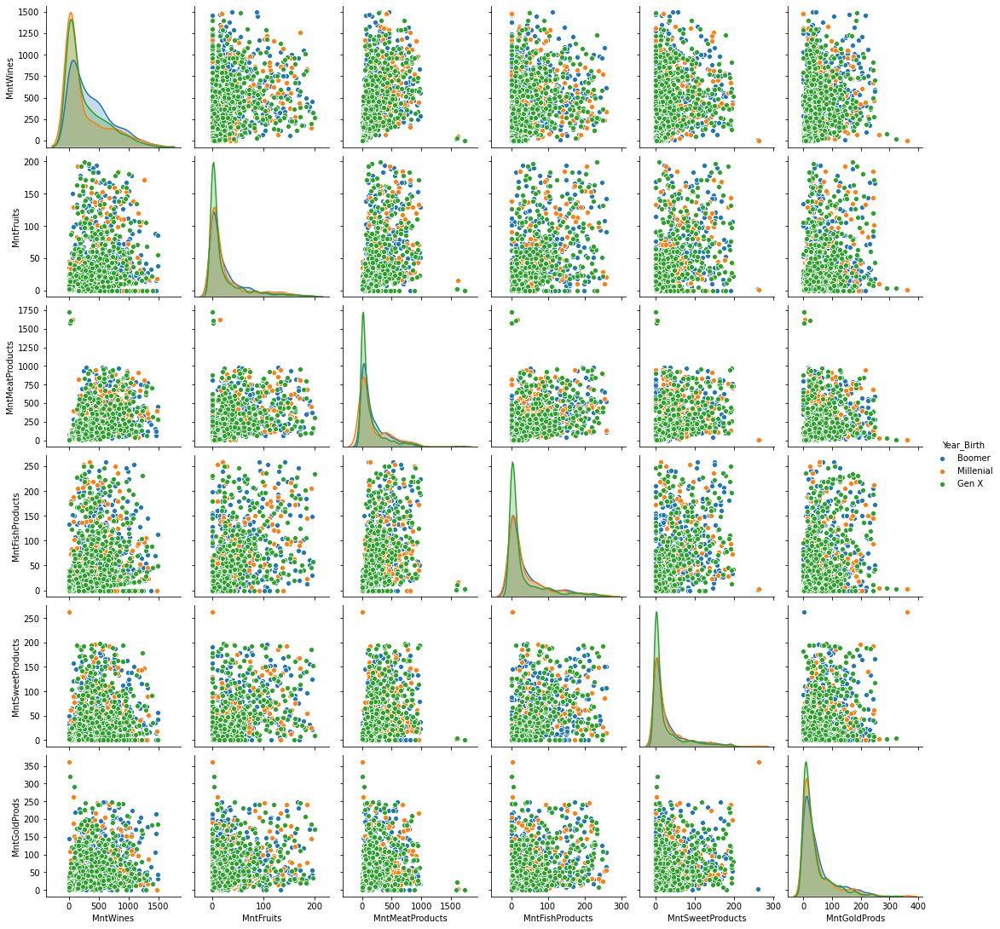

In [9]:
df = pd.read_csv("marketing_campaign_exported.csv")
df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
#df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Kidhome","Teenhome"]) # Drop other independent vars


#df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]

df["Year_Birth"] = df.apply(lambda x: "Millenial" if x["Year_Birth"] > 1980
               else ("Gen X" if x["Year_Birth"] > 1965 and x["Year_Birth"] < 1980 else "Boomer"), axis=1)

print(set(df.Year_Birth))
sns.pairplot(df, hue="Year_Birth")

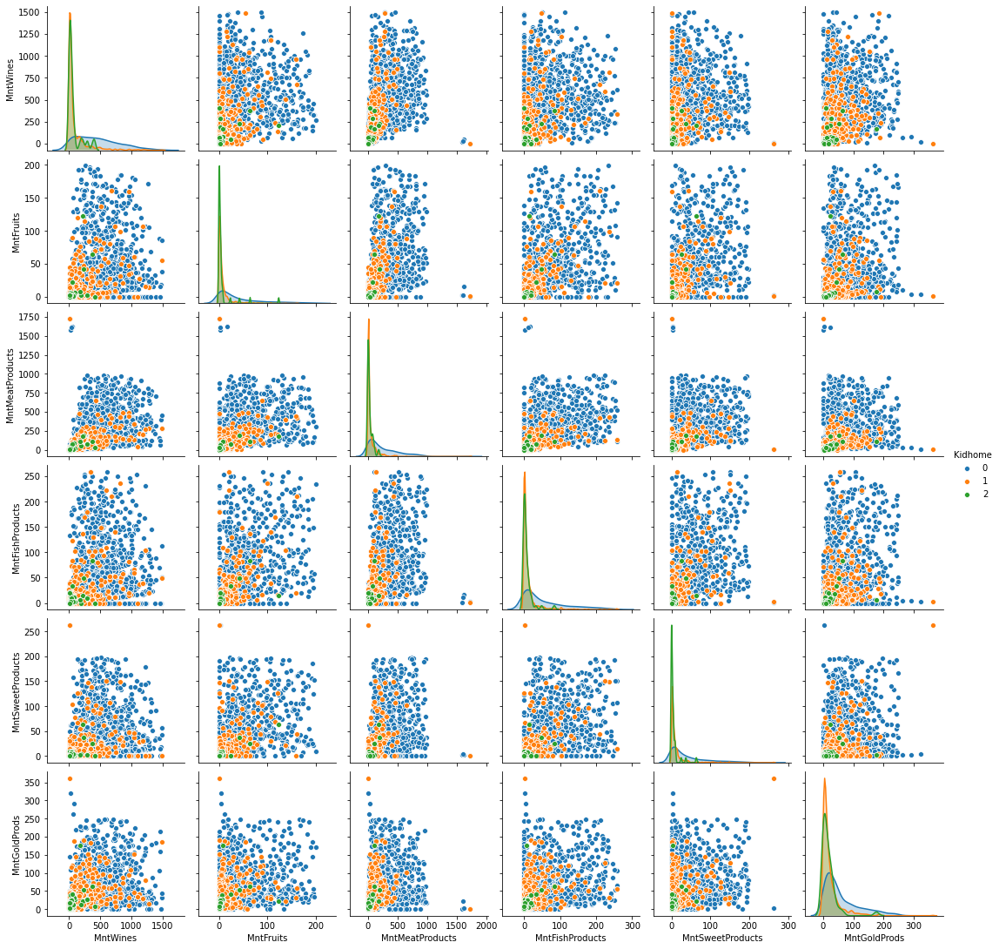

In [5]:
df = pd.read_csv("marketing_campaign_exported.csv")
df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
#df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Year_Birth","Teenhome"]) # Drop other independent vars


#df = df[(df.Marital_Status != "YOLO") & (df.Marital_Status != "Absurd") & (df.Marital_Status != "Alone")]

#df["Year_Birth"] = df.apply(lambda x: "Millenial" if x["Year_Birth"] > 1980
#               else ("Gen X" if x["Year_Birth"] > 1965 and x["Year_Birth"] < 1980 else "Boomer"), axis=1)

#print(set(df.Year_Birth))
sns.pairplot(df, hue="Kidhome")

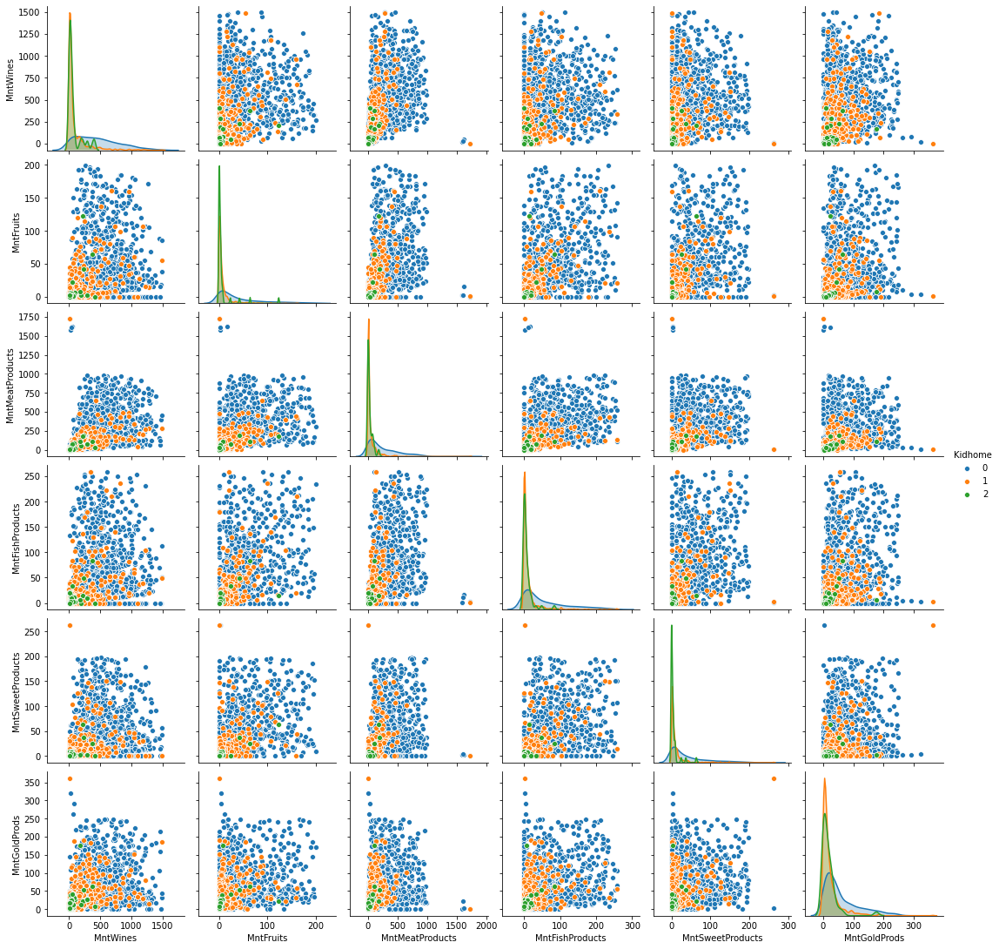

In [6]:
df = pd.read_csv("marketing_campaign_exported.csv")
df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
#df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Year_Birth","Teenhome"]) # Drop other independent vars



sns.pairplot(df, hue="Kidhome")

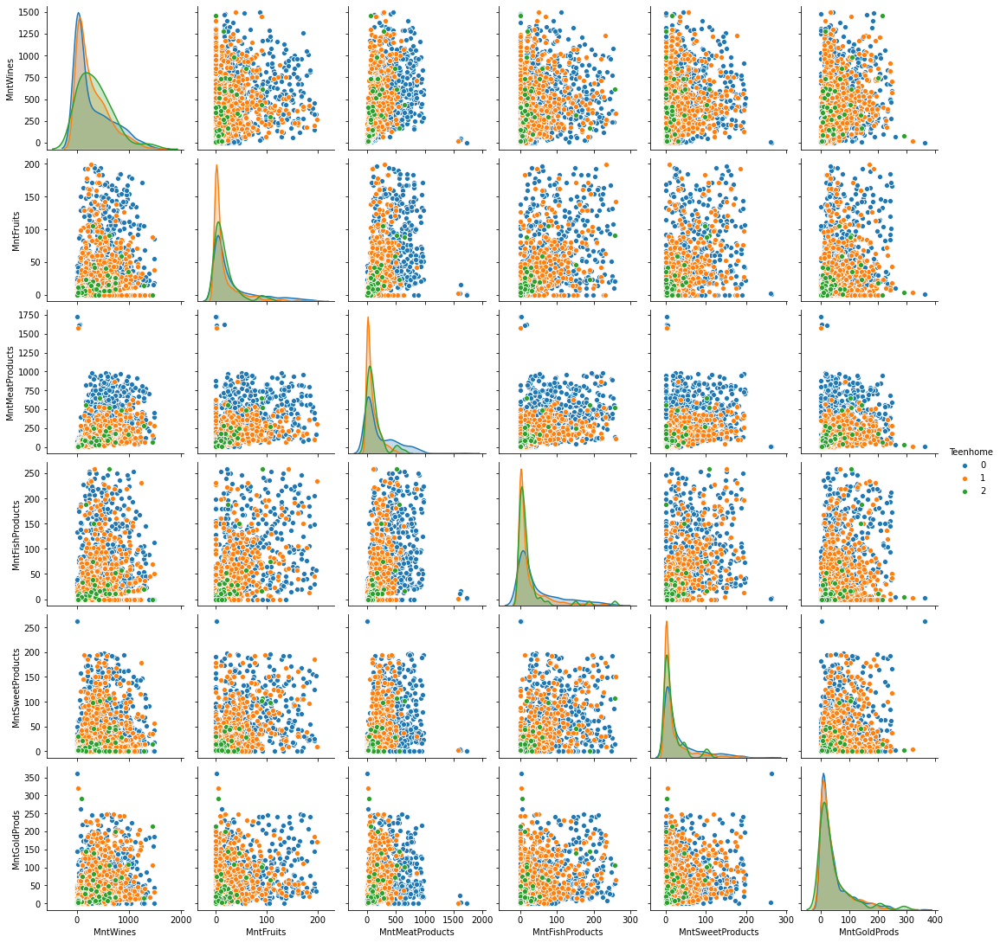

In [7]:
df = pd.read_csv("marketing_campaign_exported.csv")
df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
#df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Year_Birth","Kidhome"]) # Drop other independent vars



sns.pairplot(df, hue="Teenhome")

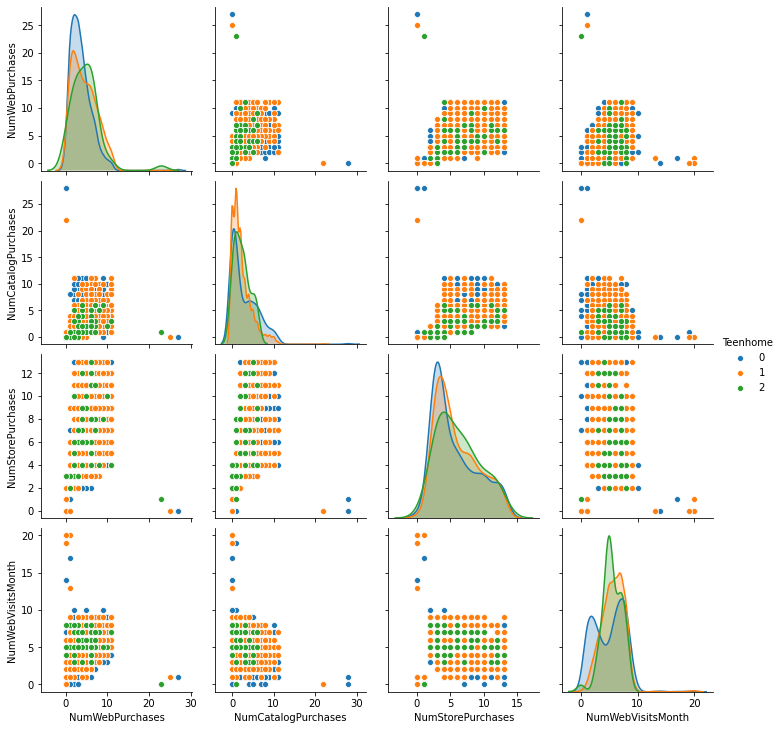

In [8]:
df = pd.read_csv("marketing_campaign_exported.csv")
#df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Year_Birth","Kidhome"]) # Drop other independent vars



sns.pairplot(df, hue="Teenhome")

In [ ]:
df = pd.read_csv("marketing_campaign_exported.csv")
#df = df.drop(columns=["NumWebPurchases","NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"])
df = df.drop(columns=["MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds"])
df = df.drop(columns=["NumDealsPurchases","AcceptedCmp1","AcceptedCmp2","AcceptedCmp3","AcceptedCmp4","AcceptedCmp5","Response"])
df = df.drop(columns=["ID","Dt_Customer","Recency","Z_CostContact","Z_Revenue", "Complain"])
df = df.drop(columns=["Marital_Status","Income","Year_Birth","Kidhome"]) # Drop other independent vars



sns.pairplot(df, hue="Teenhome")